In [1]:
import os
import tqdm
import torch
import numpy as np

import matplotlib
from matplotlib import pyplot as plt

import aegis

import matplotlib.font_manager

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
# set the False below to True to use the same font as the latest paper
# note that this takes a long time to render each pdf.
if False:
    plt.rcParams['text.usetex'] = True
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams["pgf.texsystem"] = "pdflatex"
    matplotlib.rcParams['pdf.fonttype'] = 42
    matplotlib.rcParams['ps.fonttype'] = 42
    
    # preamble from uai2021.cls
    plt.rcParams['text.latex.preamble'] = """
\\usepackage[T1]{fontenc}
\\usepackage{textcomp}
\\usepackage{mathptmx}
\\usepackage[scaled]{helvet}
\\usepackage{courier}
"""
    
    matplotlib.rcParams['backend'] = 'pdf'
    
    savefig = True
    
else:
    savefig = False

# Problem settings

In [4]:
n_runs = 51 # [1, 51] inclusive

budget = 200

problems = [
    ('Branin', {}),
    ('Eggholder', {}),
    ('GoldsteinPrice', {}),
    ('SixHumpCamel',{}),
    ('Hartmann3', {}),
    ('Ackley', {'d': 5}),
    ('Hartmann6', {}),
    ('Michalewicz', {'d': 10}),
    ('Rosenbrock', {'d': 10}),
    ('StyblinskiTang', {'d': 10}),
    ("Michalewicz", {"d": 5}),
    ("StyblinskiTang", {"d": 5}),
    ("Rosenbrock", {"d": 7}),
    ("StyblinskiTang", {"d": 7}),
    ("Ackley", {"d": 10}),
]

paper_names = {
    "Random": "Random",
    "BatchTS": "TS",
    "HalluBatchBO-EI": "KB",
    "LocalPenalisationBatchBO-EI": "LP",
    "HardLocalPenalisationBatchBO-EI": "PLAyBOOK",
    "aegisExploitRandom-sqrtd": r"AEGiS-RS",
    "aegisExploitParetoFront-sqrtd": r"AEGiS",
}

method_names = [key for key in paper_names]

workers = [4, 8, 16]

time_functions = ["halfnorm"]

tablau20 = np.array([
    [ 31, 119, 180], [255, 127,  14], [ 44, 160,  44], [214,  39,  40],
    [148, 103, 189], [140,  86,  75], [227, 119, 194], [127, 127, 127],
    [188, 189,  34], [ 23, 190, 207], [174, 199, 232], [255, 187, 120],
    [152, 223, 138], [255, 152, 150], [197, 176, 213], [196, 156, 148],
    [247, 182, 210], [199, 199, 199], [219, 219, 141], [158, 218, 229]
]) / 255.
method_cols = tablau20[:len(method_names)]

# Load the synthetic function results

In [13]:
D = aegis.plotting.read_in_results(
    time_functions, workers, problems, method_names, n_runs, budget
)

  0%|          | 0/16065 [00:00<?, ?it/s]

# Convergence plots

In [14]:
TITLE_FONTSIZE = 16#19
LABEL_FONTSIZE = 15#18
TICK_FONTSIZE = 13#16

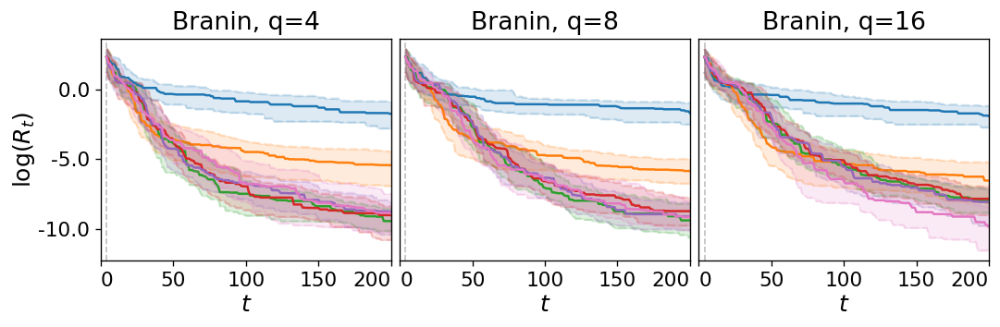

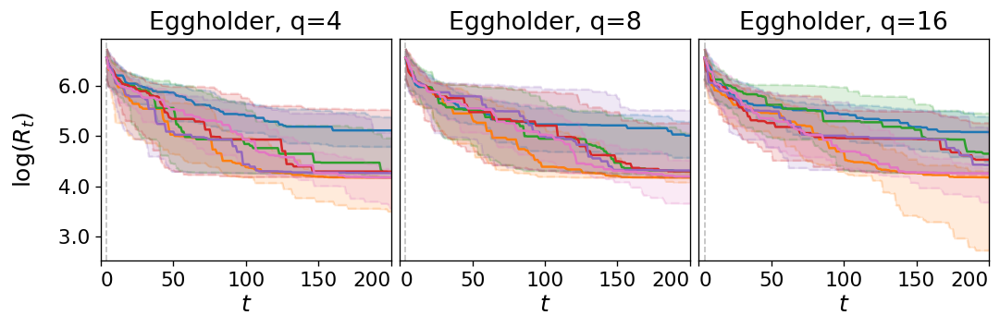

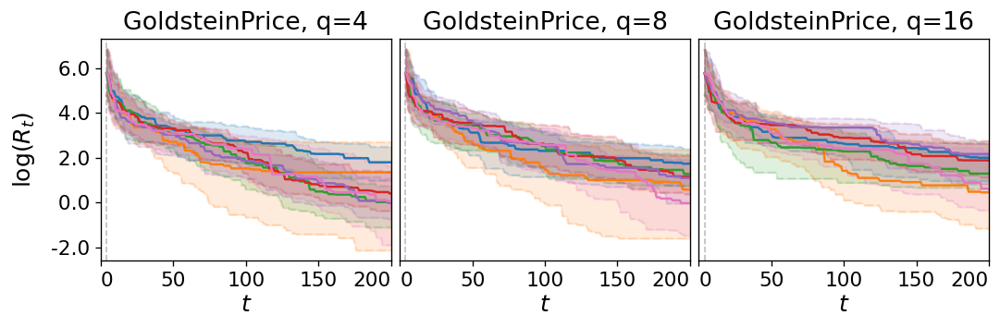

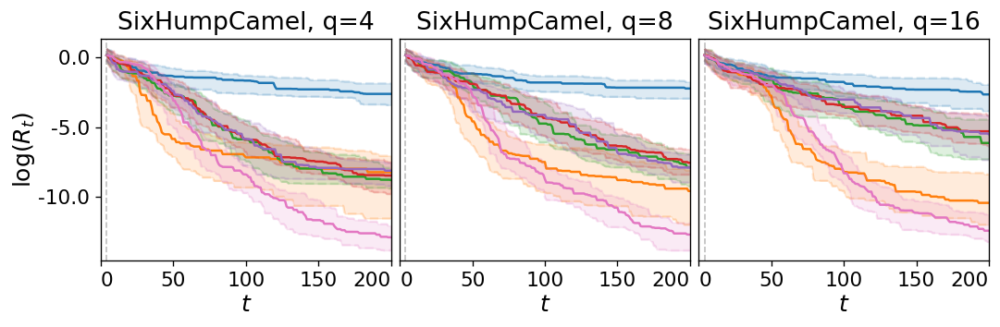

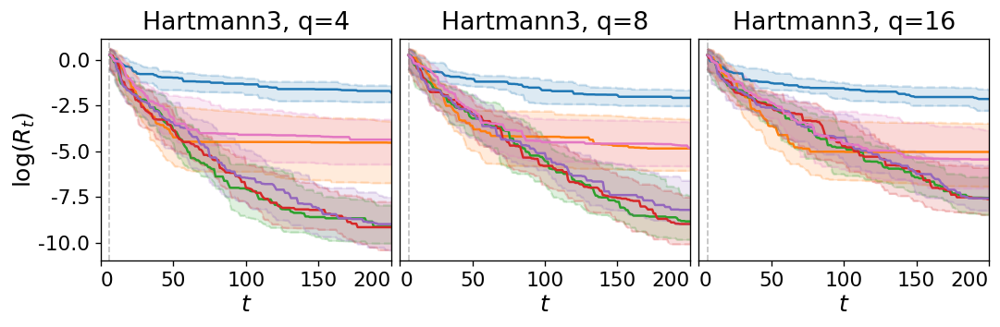

...

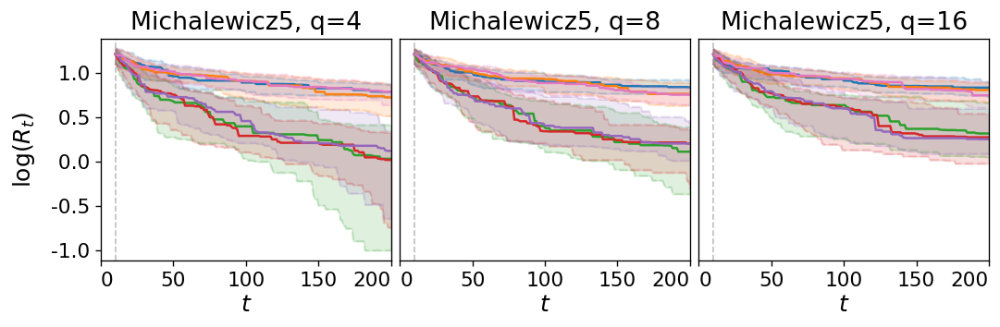

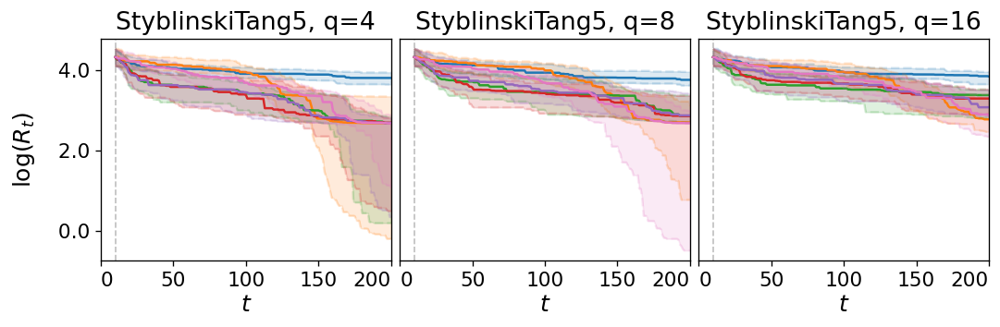

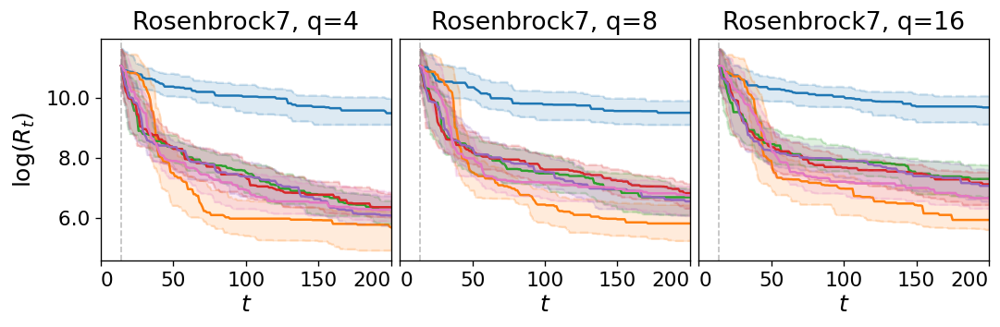

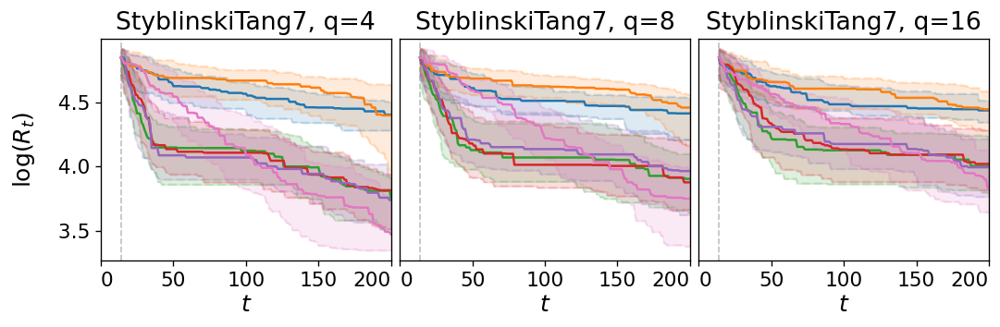

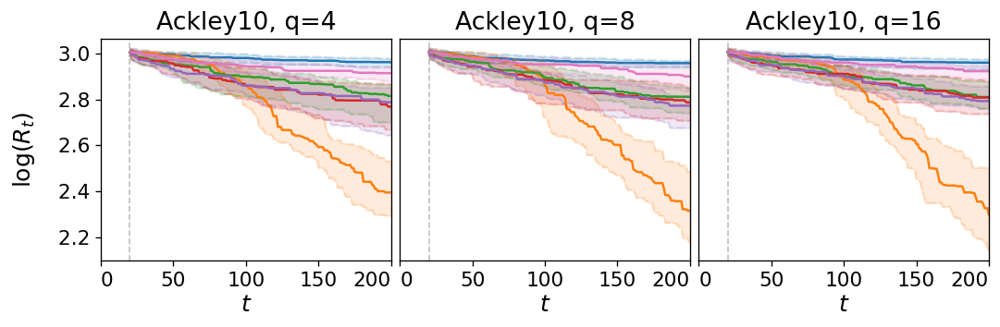

In [15]:
time_func = "halfnorm"
method_cols = (
    np.array(
        [
            [31, 119, 180],
            [255, 127, 14],
            [44, 160, 44],
            [214, 39, 40],
            [148, 103, 189],
            [227, 119, 194],
        ]
    )
    / 255
)

aegis.plotting.make_conv_plots(
    D,
    time_func,
    problems,
    workers,
    budget,
    method_names,
    method_cols,
    fname_prefix=None,
    TITLE_FONTSIZE=TITLE_FONTSIZE,
    LABEL_FONTSIZE=LABEL_FONTSIZE,
    TICK_FONTSIZE=TICK_FONTSIZE,
    savefig=savefig,
)

# Create the legend

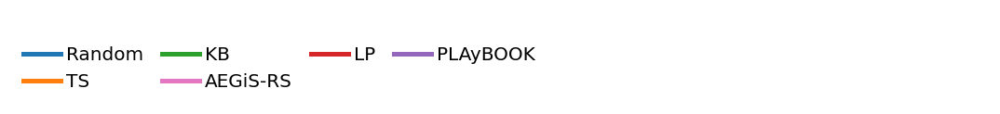

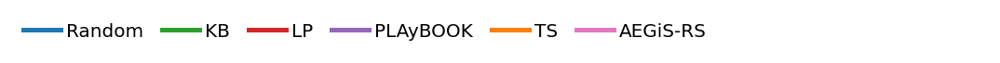

In [16]:
# indices of the methods
# 0 Random
# 1 TS
# 2 KB
# 3 LP
# 4 PLaYBOOK
# 5 AEGiS-RS
# 6 AEGiS
aegis.plotting.make_legend(
    [v for (k, v) in paper_names.items()], 
    method_cols, 
#     onecol_inds=[0, 1, 2, 5, 3, 6, 4],
#     twocol_inds=[0, 2, 3, 4, 1, 5, 6],
    onecol_inds=[0, 1, 2, 5, 3, 4],
    twocol_inds=[0, 2, 3, 4, 1, 5],
    savefig=savefig,
    fname_prefix=None,
)

# Results table

In [17]:
mn = method_names
mnt = [paper_names[m] for m in mn]

time_func = 'halfnorm'

td = aegis.plotting.create_table_data(
    D[time_func],
    workers,
    problems,
    mn,
    51
)

In [18]:
problem_rows = [
    ['Branin', 'Eggholder', 'GoldsteinPrice', 'SixHumpCamel', 'Hartmann3'],
    ['Ackley5', 'Michalewicz5', 'StyblinskiTang5', 'Hartmann6', 'Rosenbrock7'],
    ['StyblinskiTang7', 'Ackley10',  'Michalewicz10', 'Rosenbrock10', 'StyblinskiTang10']
]

problem_dim_rows = [
    [2, 2, 2, 2, 3], 
    [5, 5, 5, 6, 7],
    [7, 10, 10, 10, 10]
]
problem_paper_rows = problem_rows

for n_workers in workers:
    aegis.plotting.create_table(td, n_workers, problem_rows, problem_paper_rows,
                 problem_dim_rows, mn, mnt,
                 caption=f'N = {n_workers:d}')


\begin{table*}[t]
\setlength{\tabcolsep}{2pt}
\newcolumntype{z}{>{\small}S}
\sisetup{table-format=1.2e-1,table-number-alignment=center}
\caption{N = 4}
\resizebox{1\textwidth}{!}{%
\begin{tabular}{l Sz Sz Sz Sz Sz}
\toprule
    \bfseries Method
    & \multicolumn{2}{c}{\bfseries Branin (2)} 
    & \multicolumn{2}{c}{\bfseries Eggholder (2)} 
    & \multicolumn{2}{c}{\bfseries GoldsteinPrice (2)} 
    & \multicolumn{2}{c}{\bfseries SixHumpCamel (2)} 
    & \multicolumn{2}{c}{\bfseries Hartmann3 (3)} \\ 
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}  \\ \midrule
    Random & 1.73e-01 & 2.02e-01 & 1.66e+02 & 7.34e+01 & 5.99e+00 & 6.22e+00 & 7.35e-02 & 6.39e-02 & 1.71e-01 & 1.07e-01 \\
    TS & 4.39e-03 & 5.65e-03 & \best 6.51e+01 & \best 2.06e

# How many times each method is equal to the best performing method

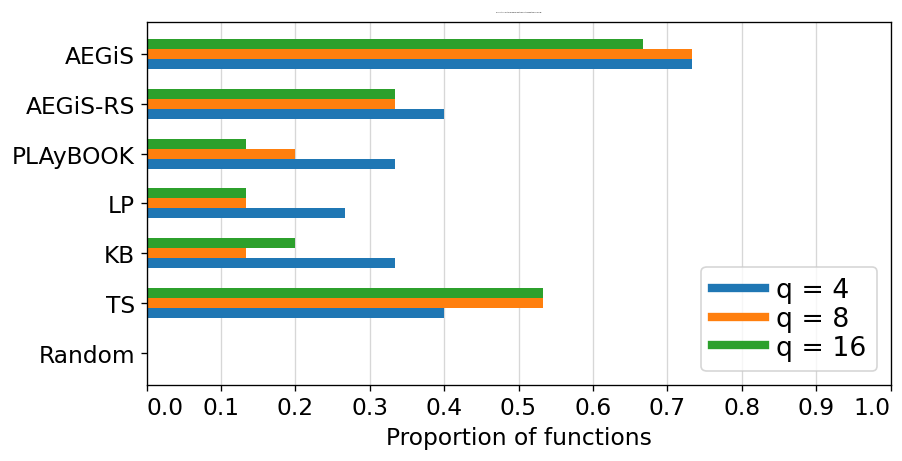

In [19]:
aegis.plotting.make_equaltobest_plot(
    td, 
    mnt, 
    problems, 
    workers,
    TICK_FONTSIZE=14,#18,
    LEGEND_FONTSIZE=16,# 20,
    TITLE_FONTSIZE=0, #20,
    fname_prefix=None,
    savefig=savefig,
)

# Instance-based problems

In [20]:
def create_savefile_name(
    data_dir, time_func, n_workers, problem_name, pres=False
):
    save_name_list = [
        "rankdata",
        f"_{time_func}",
        f"_{n_workers}",
        f"_{problem_name}",
        "_pres" if pres else "",
        ".npz",
    ]

    return os.path.join(data_dir, "".join(save_name_list))


instance_problems = [
    ("push4", {}),
    ("push8", {}),
    ("SVM", {}),
    ("FC-NET", {}),
    ("XGBoost", {}),
]
instance_dims = [4, 8, 2, 6, 8]
n_repeats = 20  # 1 to 21

plots_for_presentation = True

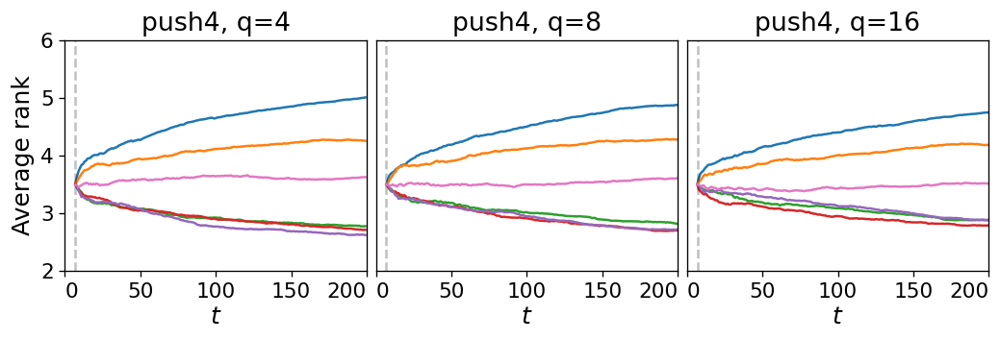

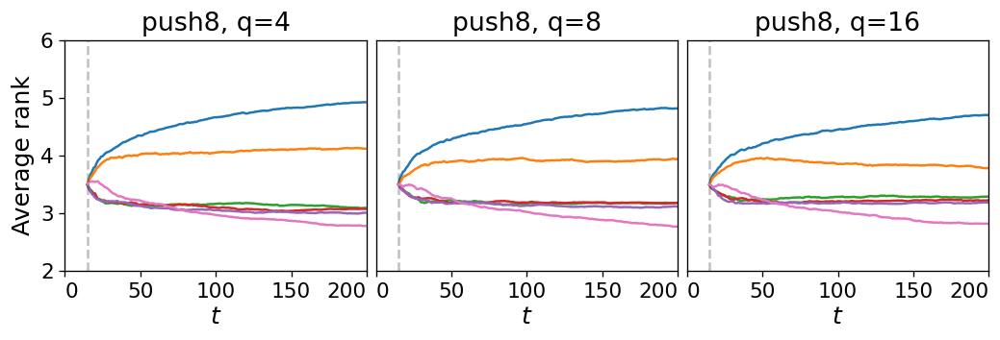

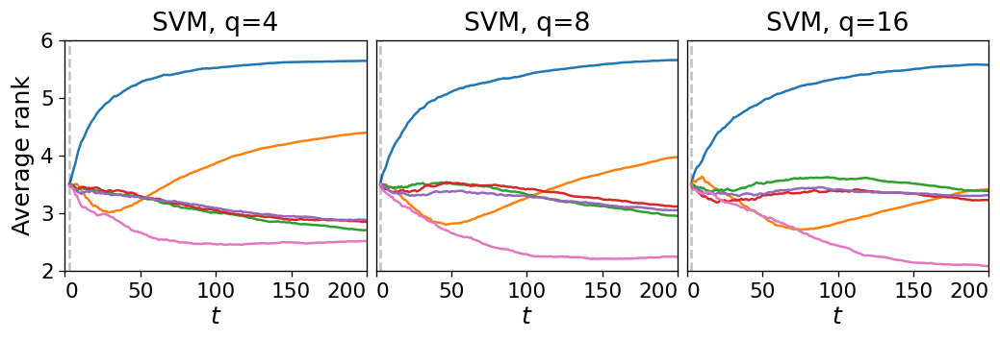

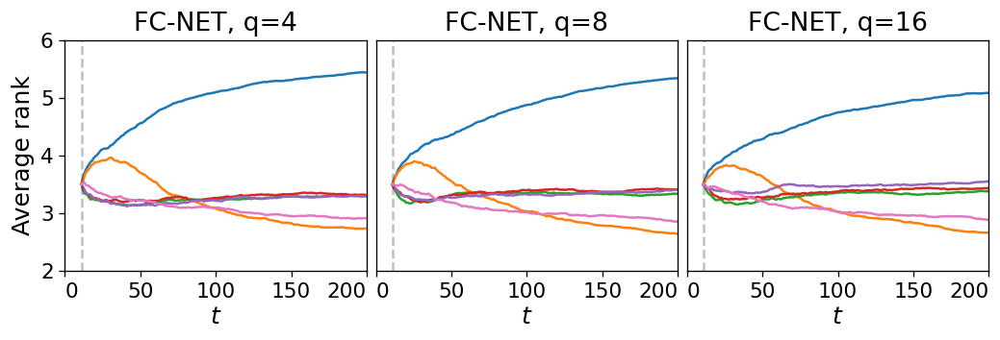

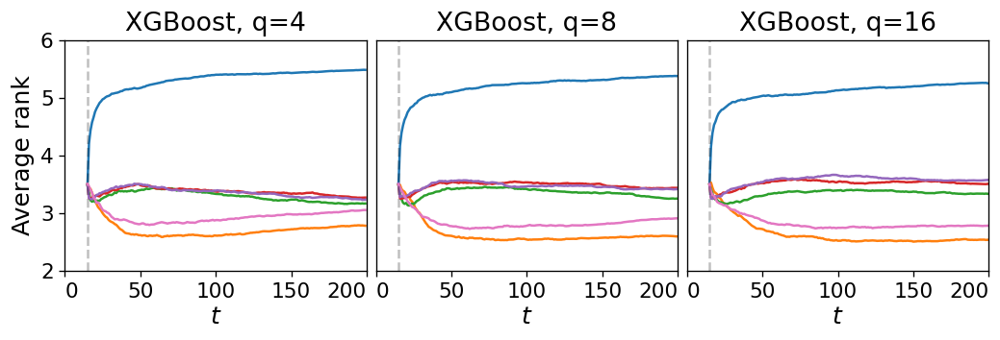

In [21]:
for (problem_name, problem_params), dim in zip(
    instance_problems, instance_dims
):

    pn = problem_name.lower().replace("-", "")
    f_class = getattr(aegis.test_problems, pn)
    f = f_class(**problem_params)

    start = 2 * f.dim - 1
    x = np.arange(budget)

    n = len(workers)

    fig, a = plt.subplots(1, n, figsize=(8, 2), sharey=True, dpi=120)

    for i, n_workers in enumerate(workers):
        ax = a[i]

        savename = create_savefile_name(
            "results", time_func, n_workers, pn, pres=plots_for_presentation,
        )
        assert os.path.exists(savename)

        with np.load(savename) as data:
            ranks = data["ranks"]

        for m, (method_name, c) in enumerate(zip(method_names, method_cols)):

            ax.plot(
                x[start:], ranks[m, start:], label=method_name, color=c,
            )

        ax.set_title(f"{problem_name}, q={n_workers}", fontsize=TITLE_FONTSIZE)

        ax.axvline(start, c="k", ls="--", alpha=0.25)

        # set the alignment for outer ticklabels
        ax.set_xticks([0, 50, 100, 150, 200])
        ticklabels = ax.get_xticklabels()
        if len(ticklabels) > 0:
            ticklabels[0].set_ha("left")
            ticklabels[-1].set_ha("right")

        if i == 0:
            ax.set_ylabel("Average rank", fontsize=LABEL_FONTSIZE)

        ax.set_xlabel("$t$", fontsize=LABEL_FONTSIZE)
        ax.set_xlim([0, 200])
        ax.set_ylim([2, 6])
        #ax.set_ylim([1.8, 7])

        ax.tick_params(axis="x", which="major", labelsize=TICK_FONTSIZE)
        ax.tick_params(axis="y", which="major", labelsize=TICK_FONTSIZE)

        ax.get_xaxis().set_label_coords(0.5, -0.15)
        # ensure labels are all in the same place!
        ax.get_yaxis().set_label_coords(-0.1, 0.5)

        if i > 0:
            ax.yaxis.set_ticks_position("none")

    plt.subplots_adjust(
        left=0, right=1, bottom=0, top=1, wspace=0.03, hspace=0
    )

    if savefig:
        plt.savefig(fr"{problem_name}.pdf", bbox_inches="tight")
    plt.show()

# Ablation study

In [22]:
paper_names_ablation = {    
    "ablationNoRandom": "No PF",
    "ablationNoSamplepathPF": "No TS",
    "ablationNoExploitPF": "No Exploit",
    "aegisExploitParetoFront-sqrtd": r"AEGiS",
}

ablation_names = [k for k in paper_names_ablation]
ablation_names_paper = [v for (k, v) in paper_names_ablation.items()]

In [23]:
ablation_D = aegis.plotting.read_in_results(
    time_functions, workers, problems, ablation_names, n_runs, budget
)

  0%|          | 0/9180 [00:00<?, ?it/s]

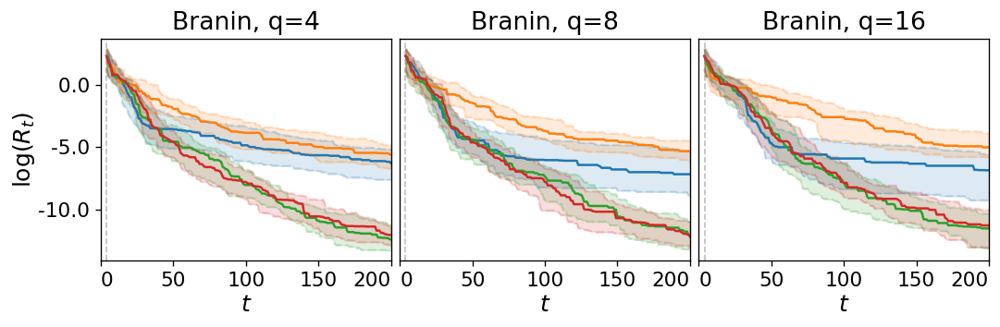

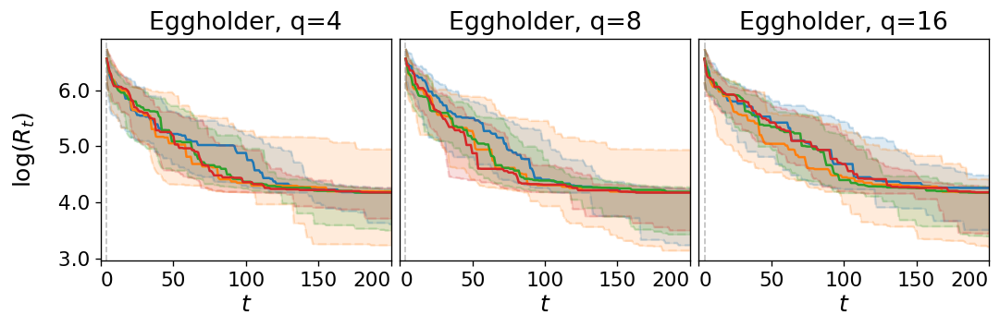

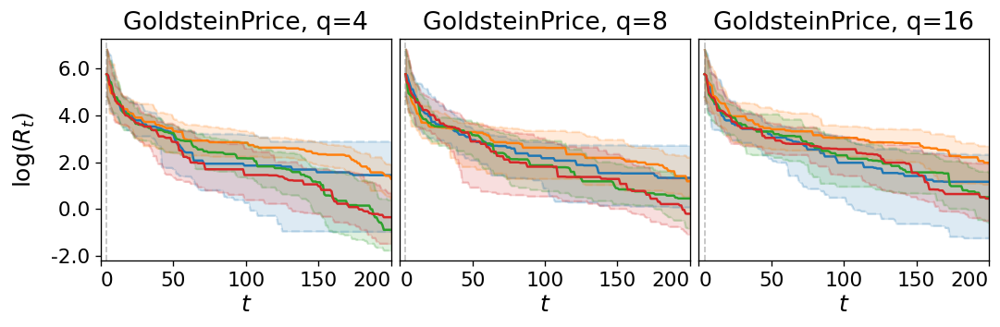

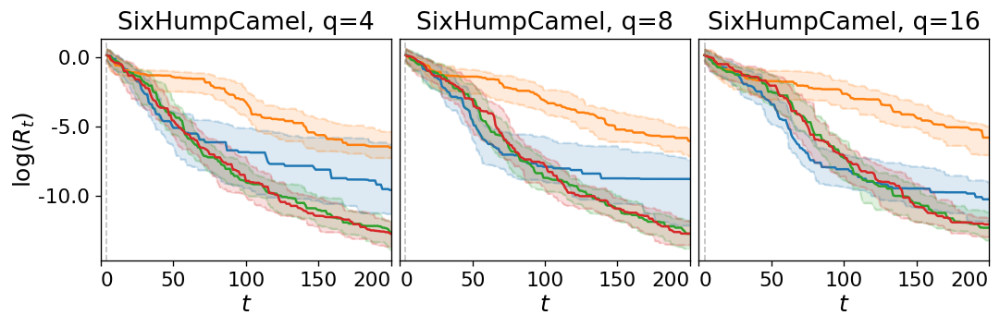

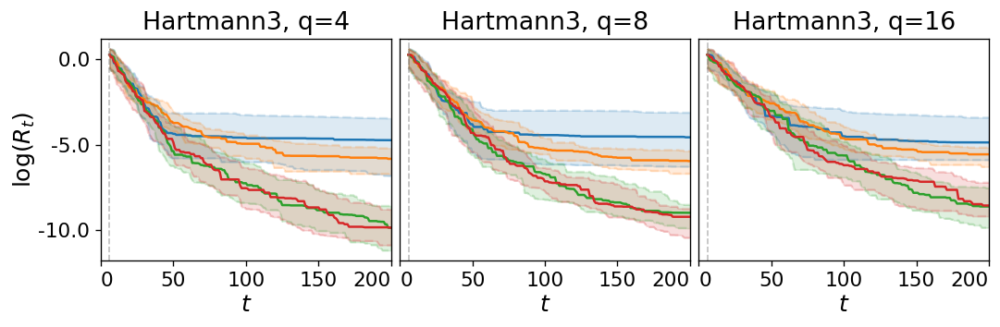

...

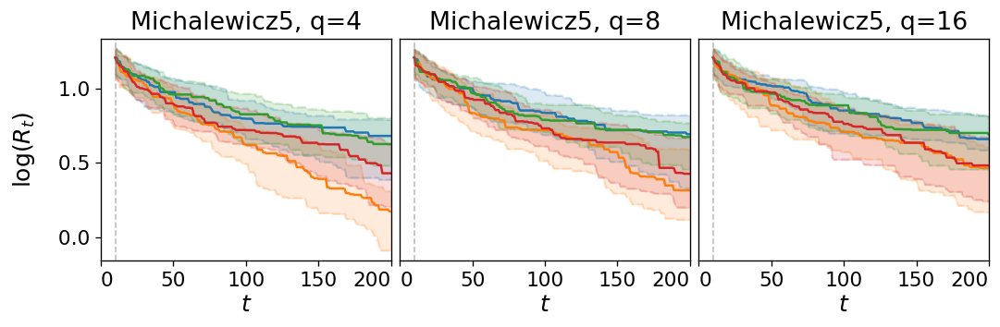

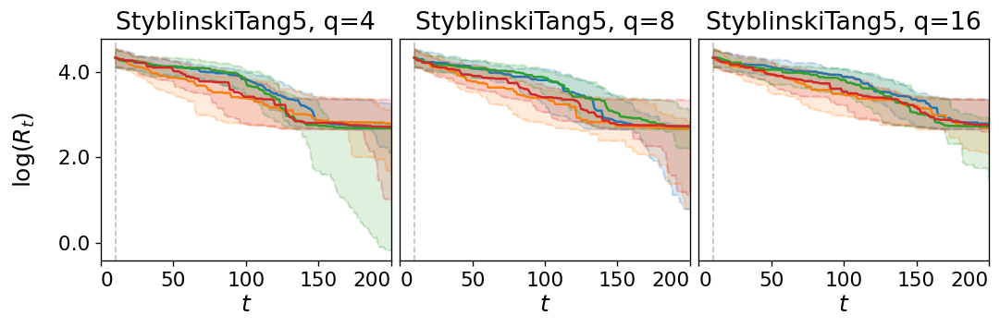

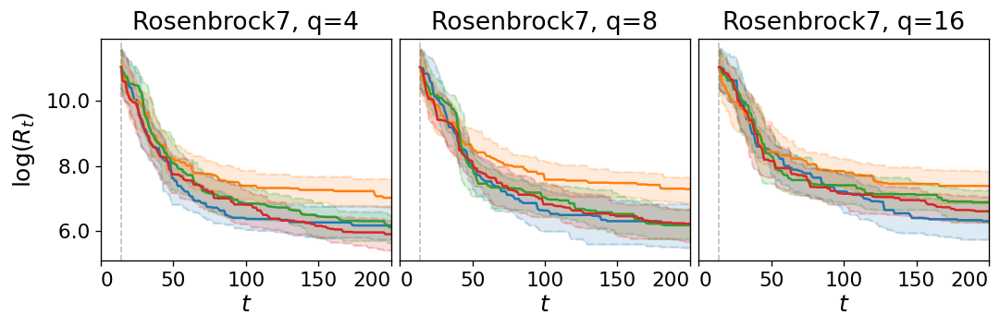

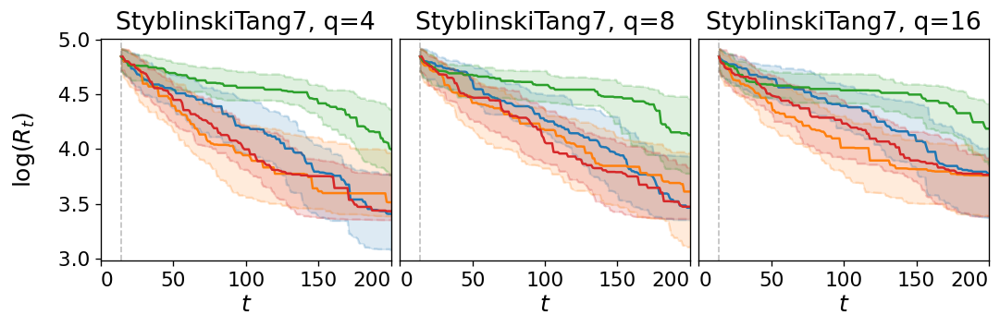

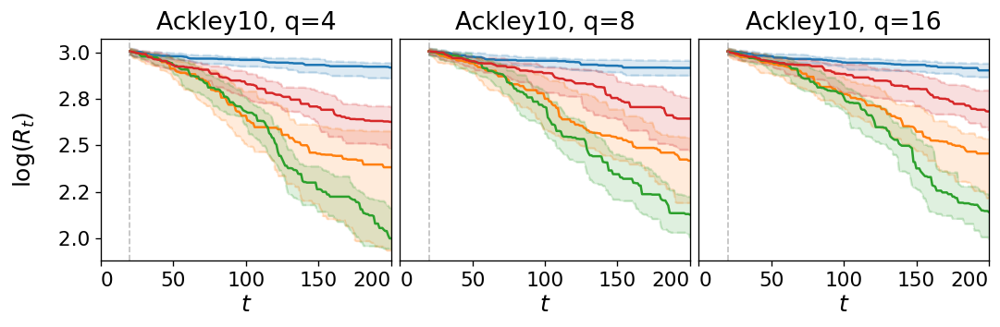

In [24]:
time_func = 'halfnorm'

aegis.plotting.make_conv_plots(
    ablation_D,
    time_func,
    problems,
    workers,
    budget,
    ablation_names,
    method_cols,
    fname_prefix="ablation",
    TITLE_FONTSIZE=TITLE_FONTSIZE,
    LABEL_FONTSIZE=LABEL_FONTSIZE,
    TICK_FONTSIZE=TICK_FONTSIZE,
    savefig=savefig,
)

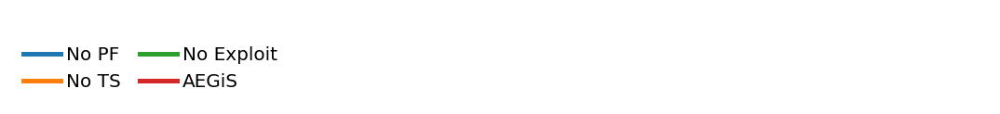

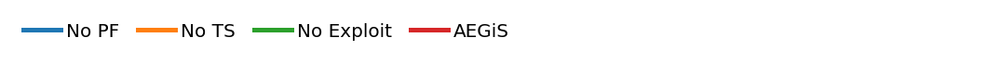

In [25]:
# ['No PF', 'No TS', 'No Exploit', 'AEGiS']
aegis.plotting.make_legend(
    ablation_names_paper, 
    method_cols, 
    onecol_inds=[0, 1, 2, 3],
    twocol_inds=[0, 1, 2, 3],
    savefig=True,
    fname_prefix="ablation",
)

In [26]:
time_func = 'halfnorm'

ablation_td = aegis.plotting.create_table_data(
    ablation_D[time_func],
    workers,
    problems,
    ablation_names,
    51
)

In [27]:
problem_rows = [
    ['Branin', 'Eggholder', 'GoldsteinPrice', 'SixHumpCamel', 'Hartmann3'],
    ['Ackley5', 'Michalewicz5', 'StyblinskiTang5', 'Hartmann6', 'Rosenbrock7'],
    ['StyblinskiTang7', 'Ackley10',  'Michalewicz10', 'Rosenbrock10', 'StyblinskiTang10']
]

problem_dim_rows = [
    [2, 2, 2, 2, 3], 
    [5, 5, 5, 6, 7],
    [7, 10, 10, 10, 10]
]

problem_paper_rows = problem_rows

for n_workers in workers:
    aegis.plotting.create_table(
        ablation_td, 
        n_workers, 
        problem_rows, 
        problem_paper_rows,
        problem_dim_rows, 
        ablation_names, 
        ablation_names_paper,
        caption=f'N = {n_workers:d}'
    )


\begin{table*}[t]
\setlength{\tabcolsep}{2pt}
\newcolumntype{z}{>{\small}S}
\sisetup{table-format=1.2e-1,table-number-alignment=center}
\caption{N = 4}
\resizebox{1\textwidth}{!}{%
\begin{tabular}{l Sz Sz Sz Sz Sz}
\toprule
    \bfseries Method
    & \multicolumn{2}{c}{\bfseries Branin (2)} 
    & \multicolumn{2}{c}{\bfseries Eggholder (2)} 
    & \multicolumn{2}{c}{\bfseries GoldsteinPrice (2)} 
    & \multicolumn{2}{c}{\bfseries SixHumpCamel (2)} 
    & \multicolumn{2}{c}{\bfseries Hartmann3 (3)} \\ 
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}  \\ \midrule
    No PF & 1.87e-03 & 2.58e-03 & \statsimilar 6.51e+01 & \statsimilar 1.80e+01 & 4.24e+00 & 6.26e+00 & 7.00e-05 & 1.03e-04 & 8.84e-03 & 1.22e-02 \\
    No TS & 3.78e-03 & 4.51e-03 & 

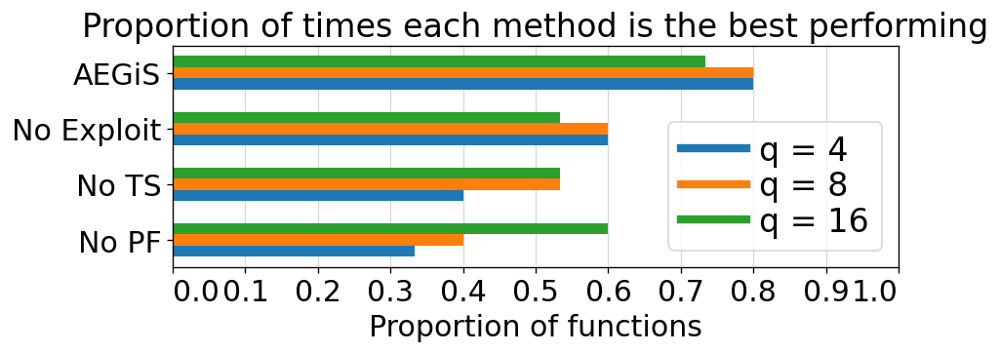

In [28]:
aegis.plotting.make_equaltobest_plot(
    ablation_td, 
    ablation_names_paper, 
    problems, 
    workers,
    plotheight=2.5,
    TICK_FONTSIZE=18,
    LEGEND_FONTSIZE=20,
    TITLE_FONTSIZE=20,
    fname_prefix="ablation",
    savefig=savefig,
)

# epsilon bracketing

In [29]:
paper_names_bracketing = {
    "aegisExploitParetoFront-sqrtd": "AEGiS", # r"$2 / \sqrt{d}$ (AEGiS)",
    "aegisExploitParetoFront-dtake2": "Faster", # "$2 / (d - 2)$",
    "aegisExploitParetoFront-logdplus3": "Slower", # r"$2 / \log(d + 3)$",
}

bracketing_names = list(paper_names_bracketing.keys())
bracketing_names_paper = list(paper_names_bracketing.values())

In [30]:
bracketing_D = aegis.plotting.read_in_results(
    time_functions, workers, problems, bracketing_names, n_runs, budget
)

  0%|          | 0/6885 [00:00<?, ?it/s]

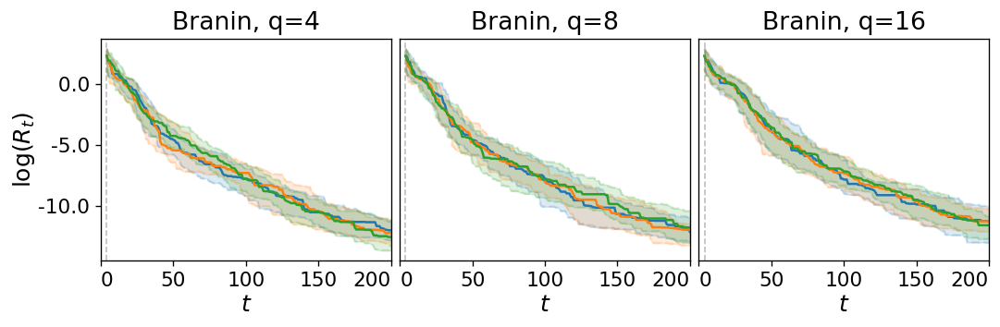

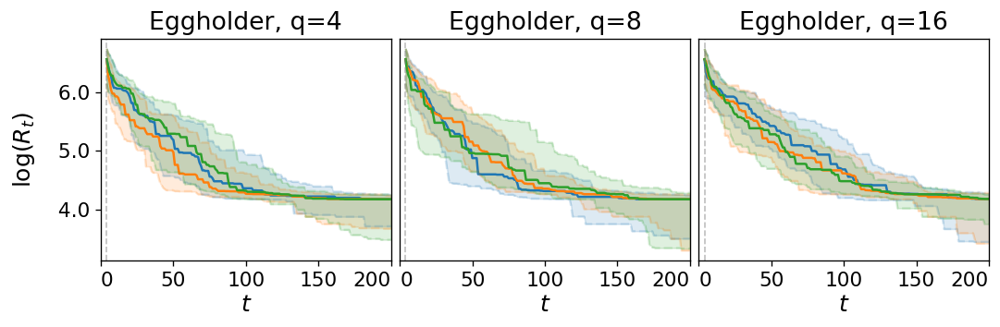

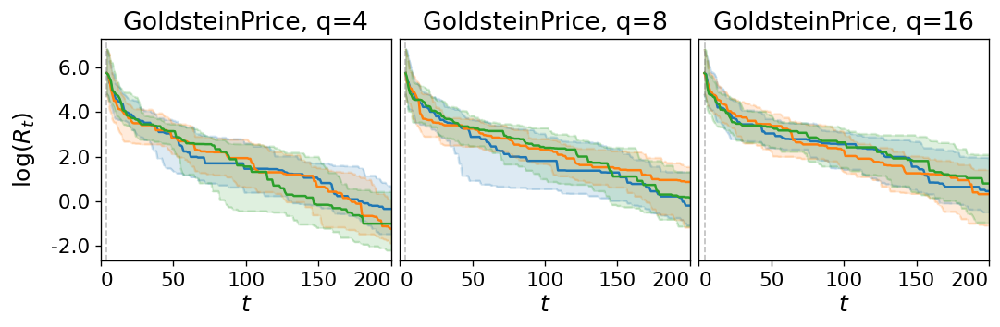

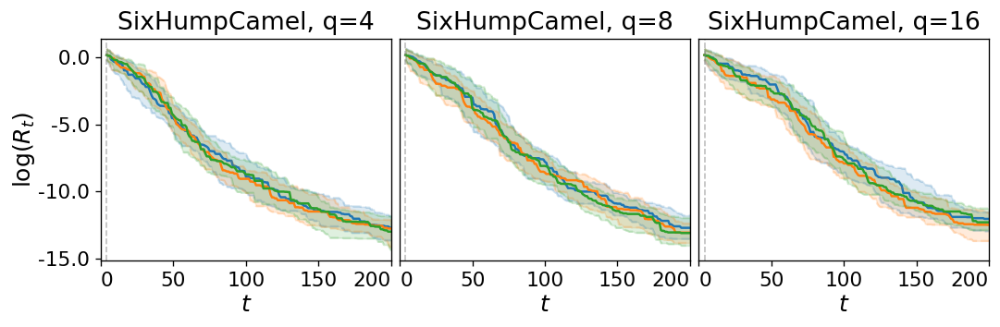

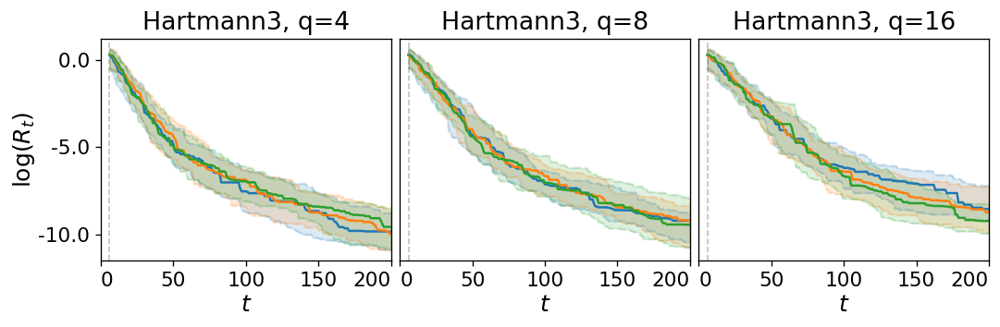

...

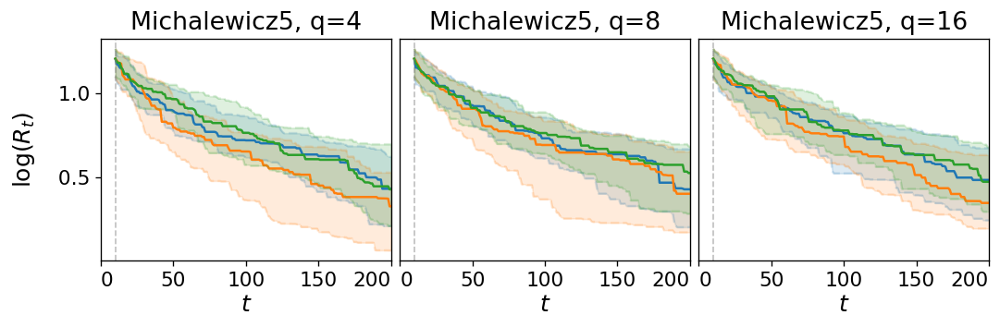

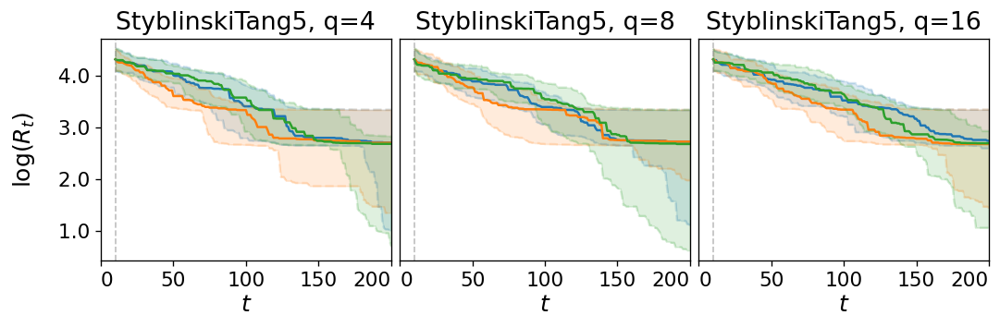

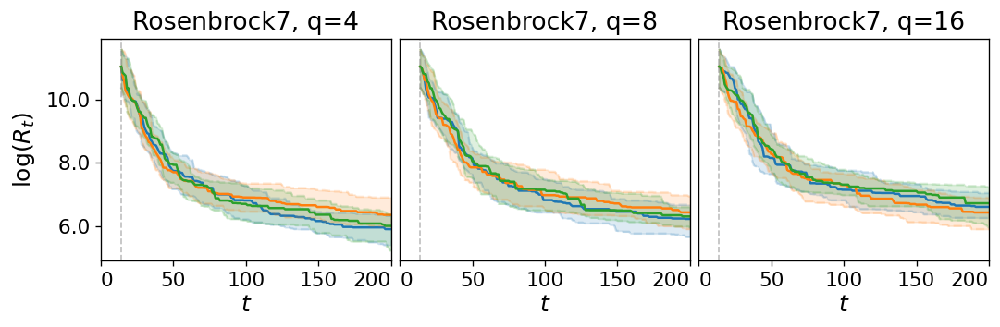

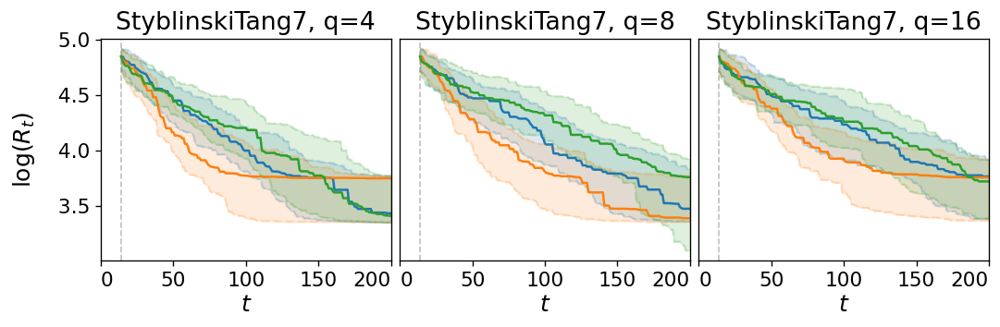

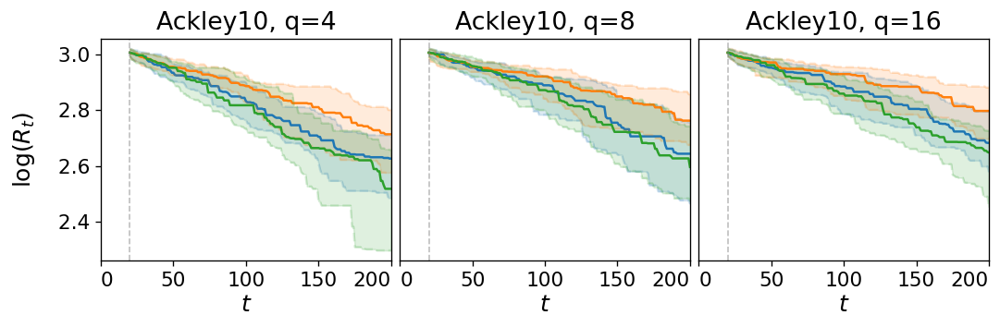

In [31]:
time_func = 'halfnorm'

aegis.plotting.make_conv_plots(
    bracketing_D,
    time_func,
    problems,
    workers,
    budget,
    bracketing_names,
    method_cols,
    fname_prefix="epsbracket",
    TITLE_FONTSIZE=TITLE_FONTSIZE,
    LABEL_FONTSIZE=LABEL_FONTSIZE,
    TICK_FONTSIZE=TICK_FONTSIZE,
    savefig=savefig,
)

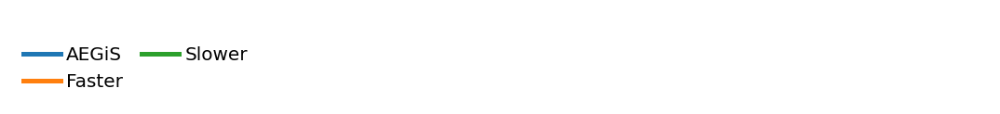

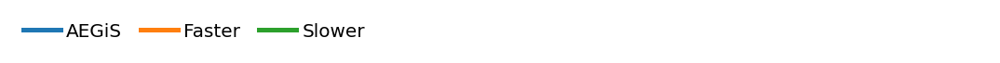

In [32]:
# ['No PF', 'No TS', 'No Exploit', 'AEGiS']
aegis.plotting.make_legend(
    bracketing_names_paper, 
    method_cols, 
    onecol_inds=[0, 1, 2],
    twocol_inds=[0, 1, 2],
    savefig=savefig,
    fname_prefix="epsbracket",
)

In [33]:
time_func = 'halfnorm'

bracketing_td = aegis.plotting.create_table_data(
    bracketing_D[time_func],
    workers,
    problems,
    bracketing_names,
    51
)

In [34]:
problem_rows = [
    ['Branin', 'Eggholder', 'GoldsteinPrice', 'SixHumpCamel', 'Hartmann3'],
    ['Ackley5', 'Michalewicz5', 'StyblinskiTang5', 'Hartmann6', 'Rosenbrock7'],
    ['StyblinskiTang7', 'Ackley10',  'Michalewicz10', 'Rosenbrock10', 'StyblinskiTang10']
]

problem_dim_rows = [
    [2, 2, 2, 2, 3], 
    [5, 5, 5, 6, 7],
    [7, 10, 10, 10, 10]
]

problem_paper_rows = problem_rows

for n_workers in workers:
    aegis.plotting.create_table(
        bracketing_td, 
        n_workers, 
        problem_rows, 
        problem_paper_rows,
        problem_dim_rows, 
        bracketing_names, 
        bracketing_names_paper,
        caption=f'N = {n_workers:d}'
    )


\begin{table*}[t]
\setlength{\tabcolsep}{2pt}
\newcolumntype{z}{>{\small}S}
\sisetup{table-format=1.2e-1,table-number-alignment=center}
\caption{N = 4}
\resizebox{1\textwidth}{!}{%
\begin{tabular}{l Sz Sz Sz Sz Sz}
\toprule
    \bfseries Method
    & \multicolumn{2}{c}{\bfseries Branin (2)} 
    & \multicolumn{2}{c}{\bfseries Eggholder (2)} 
    & \multicolumn{2}{c}{\bfseries GoldsteinPrice (2)} 
    & \multicolumn{2}{c}{\bfseries SixHumpCamel (2)} 
    & \multicolumn{2}{c}{\bfseries Hartmann3 (3)} \\ 
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}  \\ \midrule
    AEGiS & \statsimilar 5.99e-06 & \statsimilar 6.90e-06 & \statsimilar 6.52e+01 & \statsimilar 1.08e+01 & \statsimilar 6.99e-01 & \statsimilar 7.67e-01 & \statsimilar 2.93e-06 & \st

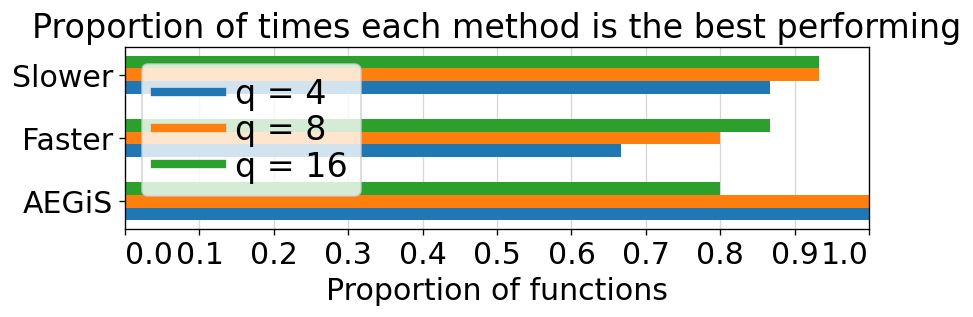

In [35]:
aegis.plotting.make_equaltobest_plot(
    bracketing_td, 
    bracketing_names_paper, 
    problems, 
    workers,
    legendloc="upper left",
    plotheight=2,
    TICK_FONTSIZE=18,
    LEGEND_FONTSIZE=20,
    TITLE_FONTSIZE=20,
    fname_prefix="epsbracket",
    savefig=savefig,
)

# Sequential results (i.e. $q=1$ workers)

  0%|          | 0/3825 [00:00<?, ?it/s]

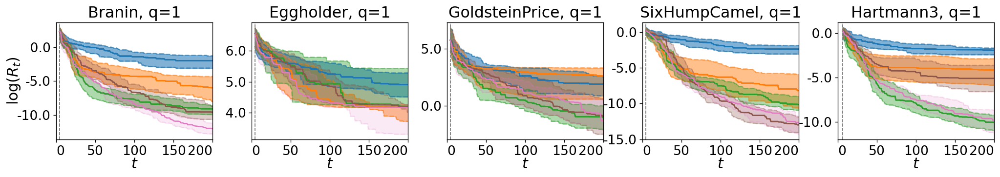

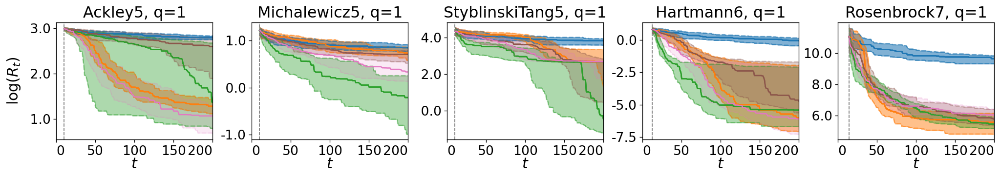

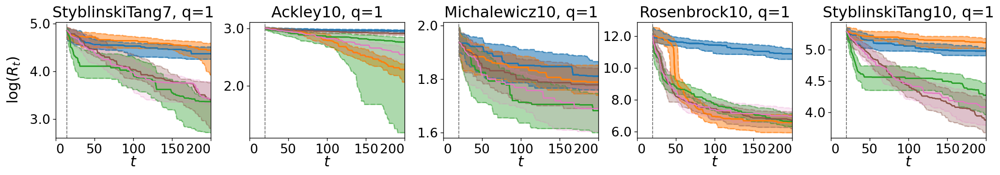

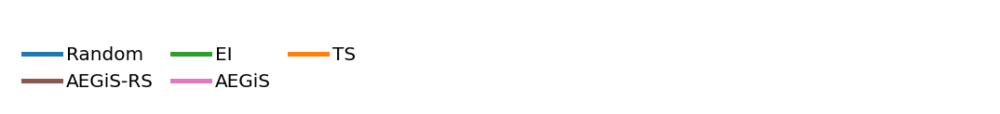

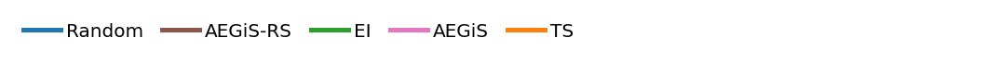


\begin{table*}[t]
\setlength{\tabcolsep}{2pt}
\newcolumntype{z}{>{\small}S}
\sisetup{table-format=1.2e-1,table-number-alignment=center}
\caption{q1_synth N = 1}
\resizebox{1\textwidth}{!}{%
\begin{tabular}{l Sz Sz Sz Sz Sz}
\toprule
    \bfseries Method
    & \multicolumn{2}{c}{\bfseries Branin (2)} 
    & \multicolumn{2}{c}{\bfseries Eggholder (2)} 
    & \multicolumn{2}{c}{\bfseries GoldsteinPrice (2)} 
    & \multicolumn{2}{c}{\bfseries SixHumpCamel (2)} 
    & \multicolumn{2}{c}{\bfseries Hartmann3 (3)} \\ 
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}  \\ \midrule
    Random & 1.37e-01 & 1.41e-01 & 1.35e+02 & 7.08e+01 & 6.75e+00 & 7.57e+00 & 9.30e-02 & 7.41e-02 & 1.46e-01 & 7.08e-02 \\
    TS & 2.51e-03 & 3.58e-03 & \statsimilar 6.51e+

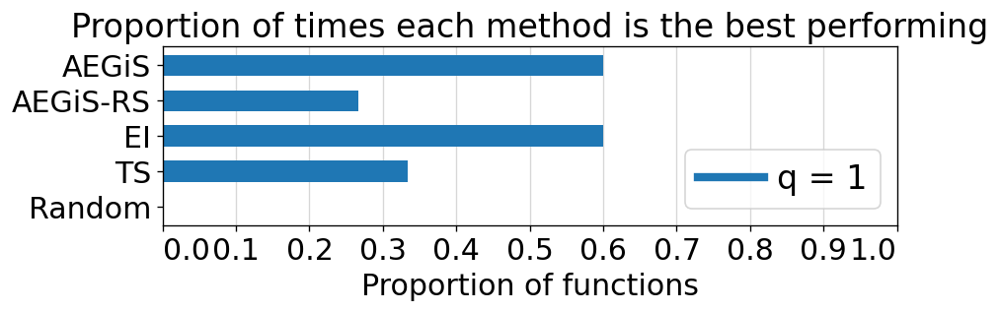

  0%|          | 0/3060 [00:00<?, ?it/s]

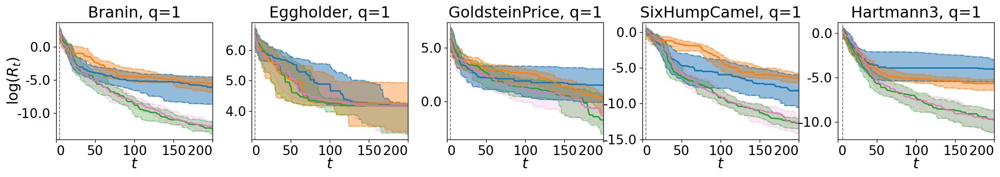

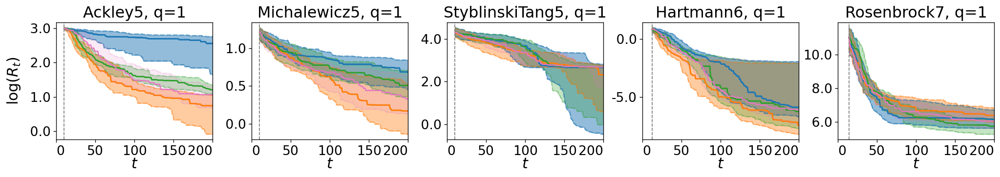

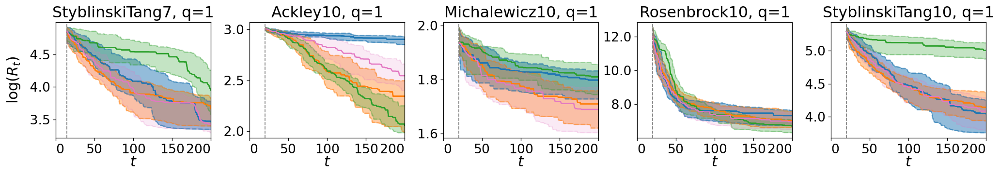

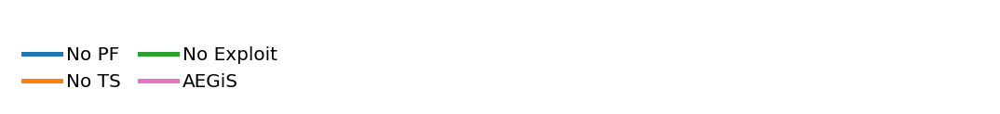

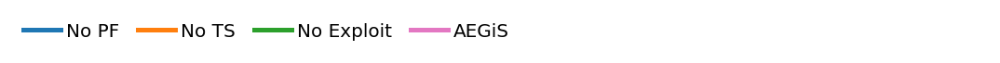


\begin{table*}[t]
\setlength{\tabcolsep}{2pt}
\newcolumntype{z}{>{\small}S}
\sisetup{table-format=1.2e-1,table-number-alignment=center}
\caption{q1_ablation N = 1}
\resizebox{1\textwidth}{!}{%
\begin{tabular}{l Sz Sz Sz Sz Sz}
\toprule
    \bfseries Method
    & \multicolumn{2}{c}{\bfseries Branin (2)} 
    & \multicolumn{2}{c}{\bfseries Eggholder (2)} 
    & \multicolumn{2}{c}{\bfseries GoldsteinPrice (2)} 
    & \multicolumn{2}{c}{\bfseries SixHumpCamel (2)} 
    & \multicolumn{2}{c}{\bfseries Hartmann3 (3)} \\ 
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}  \\ \midrule
    No PF & 2.24e-03 & 3.28e-03 & 6.51e+01 & 8.41e+00 & 4.54e+00 & 6.51e+00 & 2.73e-04 & 4.01e-04 & 1.75e-02 & 2.20e-02 \\
    No TS & 3.85e-03 & 4.64e-03 & 6.96e+01 & 8.7

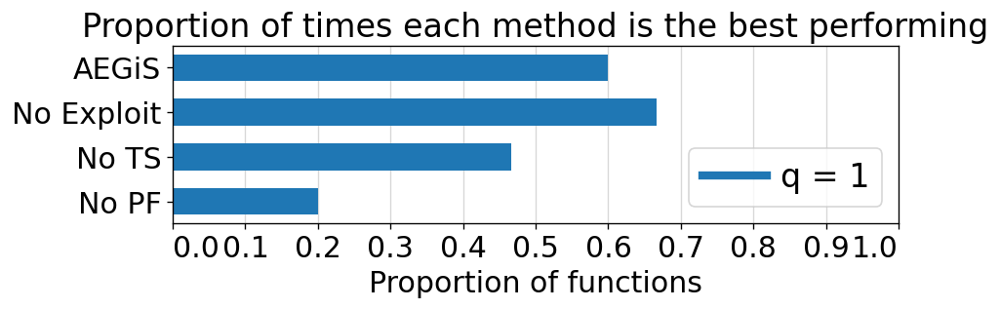

  0%|          | 0/2295 [00:00<?, ?it/s]

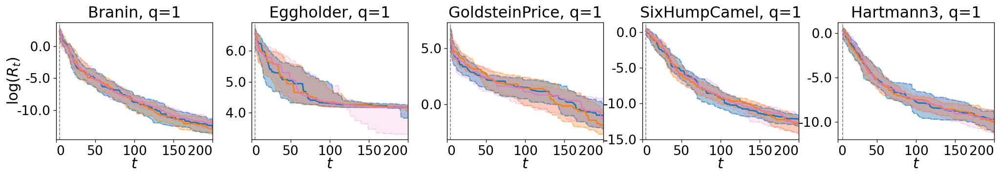

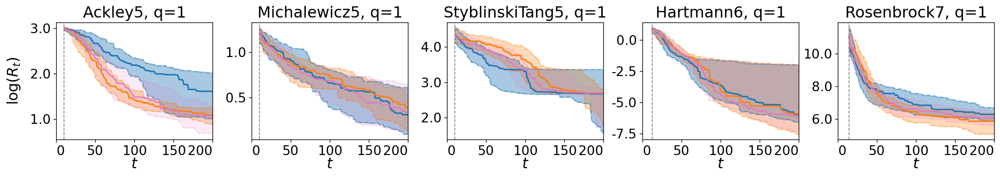

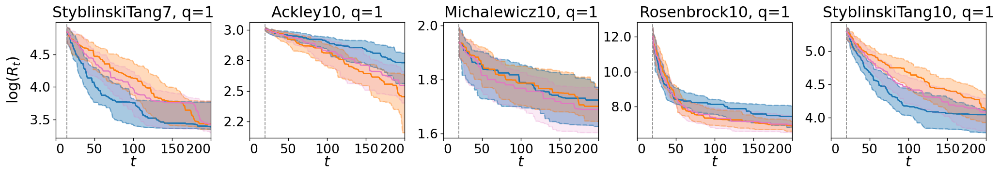

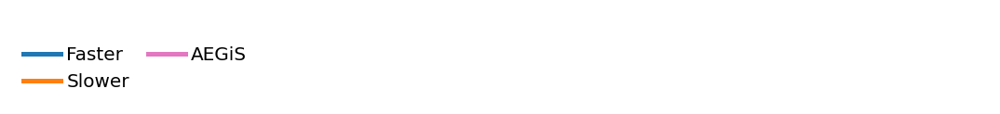

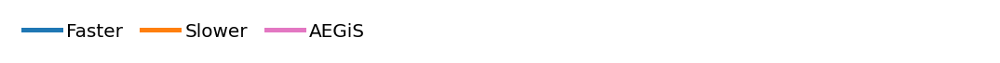


\begin{table*}[t]
\setlength{\tabcolsep}{2pt}
\newcolumntype{z}{>{\small}S}
\sisetup{table-format=1.2e-1,table-number-alignment=center}
\caption{q1_epsbracket N = 1}
\resizebox{1\textwidth}{!}{%
\begin{tabular}{l Sz Sz Sz Sz Sz}
\toprule
    \bfseries Method
    & \multicolumn{2}{c}{\bfseries Branin (2)} 
    & \multicolumn{2}{c}{\bfseries Eggholder (2)} 
    & \multicolumn{2}{c}{\bfseries GoldsteinPrice (2)} 
    & \multicolumn{2}{c}{\bfseries SixHumpCamel (2)} 
    & \multicolumn{2}{c}{\bfseries Hartmann3 (3)} \\ 
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}  \\ \midrule
    Faster & \statsimilar 3.16e-06 & \statsimilar 4.21e-06 & \statsimilar 6.51e+01 & \statsimilar 8.39e+00 & \statsimilar 3.68e-01 & \statsimilar 4.81e-01 & \statsimilar

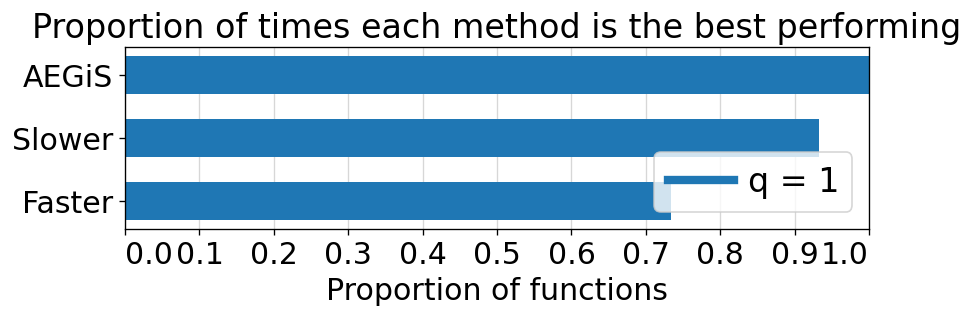

In [36]:
compare_names = {
        "Random": "Random",
        "BatchTS": "TS",
        "HalluBatchBO-EI": "EI",
        "aegisExploitRandom-sqrtd": r"AEGiS-RS",
        "aegisExploitParetoFront-sqrtd": r"AEGiS",
}
ablation_names = {
    "ablationNoRandom": "No PF",
    "ablationNoSamplepathPF": "No TS",
    "ablationNoExploitPF": "No Exploit",
    "aegisExploitParetoFront-sqrtd": r"AEGiS",
}
bracketing_names = {
    "aegisExploitParetoFront-dtake2": "Faster", # "$2 / (d - 2)$",
    "aegisExploitParetoFront-logdplus3": "Slower", # r"$2 / \log(d + 3)$",
    "aegisExploitParetoFront-sqrtd": r"AEGiS",
}

z = [compare_names, ablation_names, bracketing_names]
prefixes = ['q1_synth', 'q1_ablation', 'q1_epsbracket']
leg_handles = [
    [0, 3, 2, 4, 1],
    [0, 1, 2, 3],
    [0, 1, 2]
]
plot_cols = [
    tablau20[[0, 1, 2, 5, 6]],
    tablau20[[0, 1, 2, 6]],
    tablau20[[0, 1, 6]],
]

for (prefix, q1_paper_names, leginds, q1_method_cols) in zip(
    prefixes, 
    z,
    leg_handles,
    plot_cols,
):

    q1_method_names = list(q1_paper_names.keys())
    q1_method_names_paper = list(q1_paper_names.values())

    q1_workers = [1]

    q1_D = aegis.plotting.read_in_results(
        time_functions, q1_workers, problems, q1_method_names, n_runs, budget
    )

    # custom convergence plots - 3 rows of 5
    time_func = 'halfnorm'

    problem_rows = [
        [
            ('Branin', {}), 
            ('Eggholder', {}), 
            ('GoldsteinPrice', {}),
            ('SixHumpCamel',{}), 
            ('Hartmann3', {}),
        ],
        [
            ('Ackley', {'d': 5}), 
            ("Michalewicz", {"d": 5}),
            ("StyblinskiTang", {"d": 5}),
            ('Hartmann6', {}), 
            ("Rosenbrock", {"d": 7}),
        ],
        [
            ("StyblinskiTang", {"d": 7}),
            ("Ackley", {"d": 10}),
            ('Michalewicz', {'d': 10}), 
            ('Rosenbrock', {'d': 10}),
            ('StyblinskiTang', {'d': 10}),
        ]
    ]

    #for problem_row in problem_rows:
    for i, problem_row in enumerate(problem_rows):
        aegis.plotting.plot_solo_q(
            q1_D,
            time_func,
            problem_row,
            1,
            budget,
            q1_method_names,
            q1_method_cols,
            fname=f"{prefix:s}_{i:d}",
            TITLE_FONTSIZE=19,
            LABEL_FONTSIZE=18,
            TICK_FONTSIZE=16,
            savefig=savefig,
        )

    # ['No PF', 'No TS', 'No Exploit', 'AEGiS']
    aegis.plotting.make_legend(
        q1_method_names_paper, 
        q1_method_cols, 
        onecol_inds=leginds,
        twocol_inds=leginds,
        savefig=savefig,
        fname_prefix=prefix,
    )

    time_func = 'halfnorm'

    q1_td = aegis.plotting.create_table_data(
        q1_D[time_func],
        q1_workers,
        problems,
        q1_method_names,
        51
    )

    problem_rows = [
        ['Branin', 'Eggholder', 'GoldsteinPrice', 'SixHumpCamel', 'Hartmann3'],
        ['Ackley5', 'Michalewicz5', 'StyblinskiTang5', 'Hartmann6', 'Rosenbrock7'],
        ['StyblinskiTang7', 'Ackley10',  'Michalewicz10', 'Rosenbrock10', 'StyblinskiTang10']
    ]

    problem_dim_rows = [
        [2, 2, 2, 2, 3], 
        [5, 5, 5, 6, 7],
        [7, 10, 10, 10, 10]
    ]

    problem_paper_rows = problem_rows

    for n_workers in q1_workers:
        aegis.plotting.create_table(
            q1_td, 
            n_workers, 
            problem_rows, 
            problem_paper_rows,
            problem_dim_rows, 
            q1_method_names, 
            q1_method_names_paper,
            caption=f'{prefix} N = {n_workers:d}'
        )

    aegis.plotting.make_equaltobest_plot(
        q1_td, 
        q1_method_names_paper, 
        problems, 
        q1_workers,
        plotheight=2,
        TICK_FONTSIZE=18,
        LEGEND_FONTSIZE=20,
        TITLE_FONTSIZE=20,
        fname_prefix=prefix,
        savefig=savefig,
    )

# Epsilon decay plot for supplement

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.


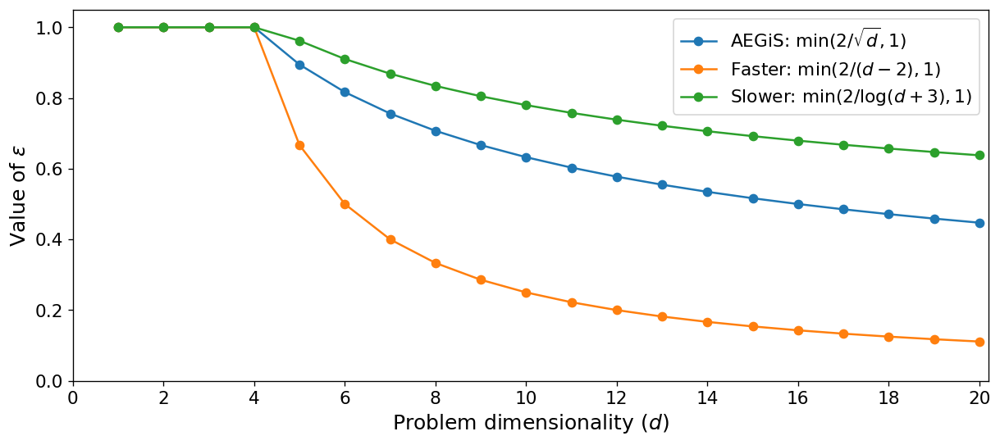

In [37]:
d = np.arange(1, 21)

a = np.minimum(2 / np.sqrt(d), 1)
b = np.minimum(2 / (d - 2), 1); b[:2] = 1
c = np.minimum(2 / np.log(3 + d), 1)

fig, ax = plt.subplots(1, 1, figsize=(12, 5), dpi=120)
ax.plot(d, a, '-o', label='AEGiS: $\min(2 / \sqrt{d}, 1)$')
ax.plot(d, b, '-o', label='Faster: $\min(2 / (d - 2), 1)$')
ax.plot(d, c, '-o', label='Slower: $\min(2 / \log(d + 3), 1)$')
ax.legend(loc='upper right', fontsize=13)


ax.set_xticks(np.arange(0, 22, 2))
ax.set_xlim([0, 20.2])
ax.set_ylim([0, 1.05])
ax.set_xlabel(r"Problem dimensionality ($d$)", fontsize=15)
ax.set_ylabel(r"Value of $\epsilon$", fontsize=15)

ax.tick_params(axis='x', which='major', labelsize=13)
ax.tick_params(axis='y', which='major', labelsize=13)
plt.savefig("epsilon_decay.pdf", bbox_inches="tight")
plt.show()

# Comparison of different weightings of TS/PF 

In [38]:
ts_prop_names = [
    "aegisExploitParetoFront-sqrtd-0.0",
    "aegisExploitParetoFront-sqrtd-0.1",
    "aegisExploitParetoFront-sqrtd-0.2",
    "aegisExploitParetoFront-sqrtd-0.3",
    "aegisExploitParetoFront-sqrtd-0.4",
    "aegisExploitParetoFront-sqrtd-0.5",
    "aegisExploitParetoFront-sqrtd-0.6",
    "aegisExploitParetoFront-sqrtd-0.7",
    "aegisExploitParetoFront-sqrtd-0.8",
    "aegisExploitParetoFront-sqrtd-0.9",
    "aegisExploitParetoFront-sqrtd-1.0",
]

ts_prop_paper_names = [
    "0.0",
    "0.1",
    "0.2",
    "0.3",
    "0.4",
    "AEGiS",
    "0.6",
    "0.7",
    "0.8",
    "0.9",
    "1.0",
]

method_cols = tablau20[:len(ts_prop_names)]

In [39]:
ts_prop_D = aegis.plotting.read_in_results(
    time_functions, workers, problems, ts_prop_names, n_runs, budget
)

  0%|          | 0/25245 [00:00<?, ?it/s]

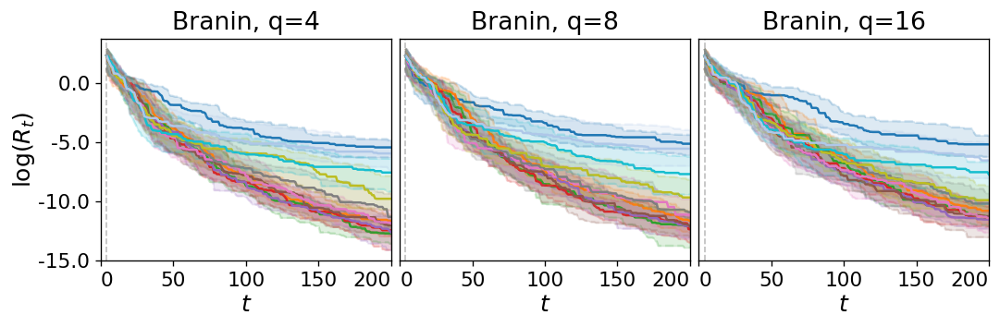

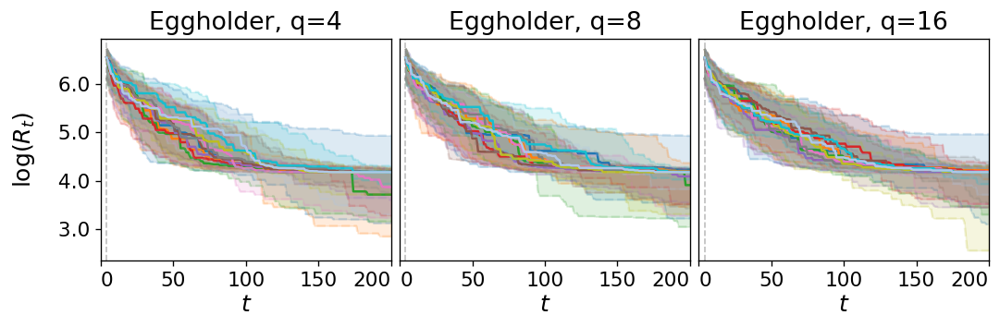

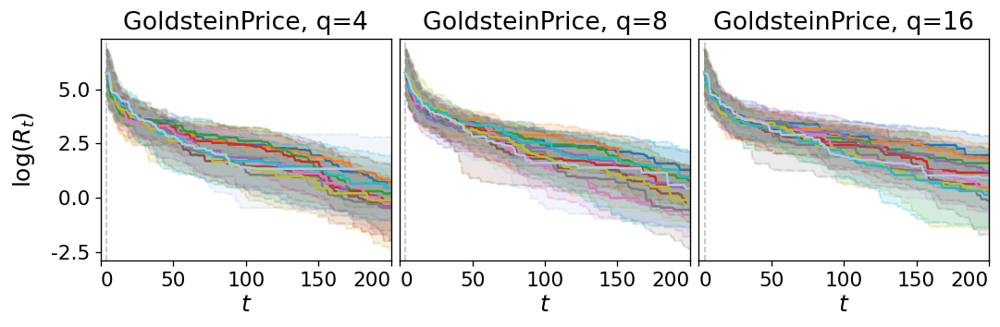

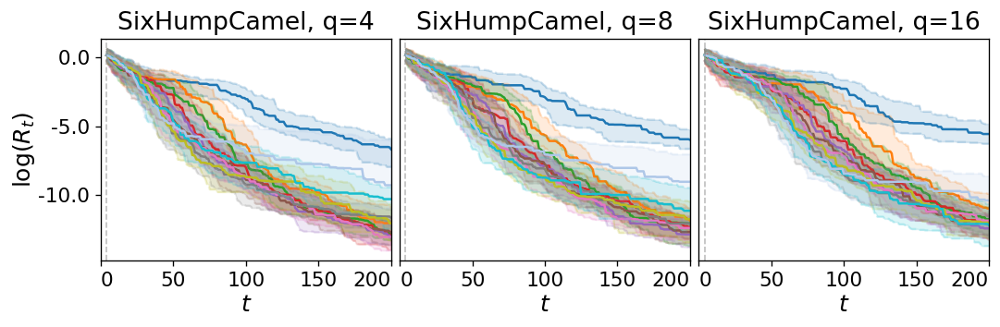

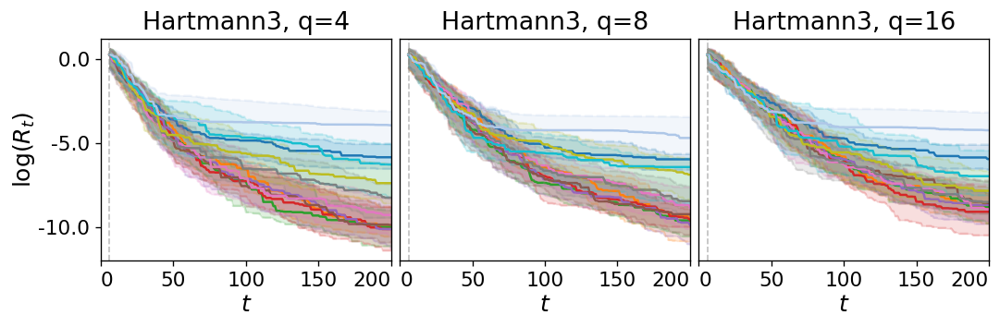

...

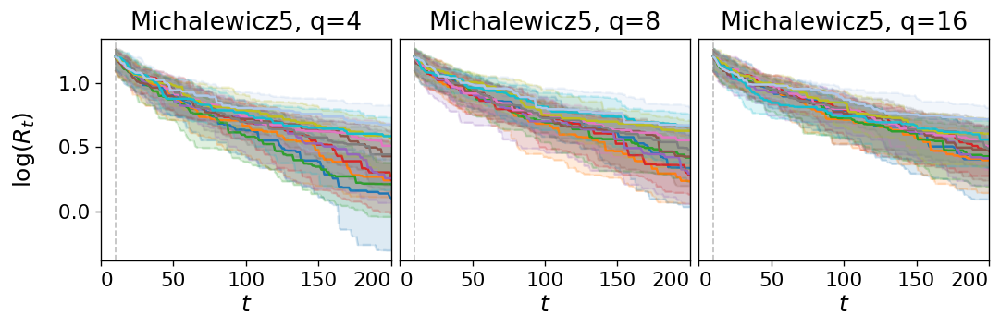

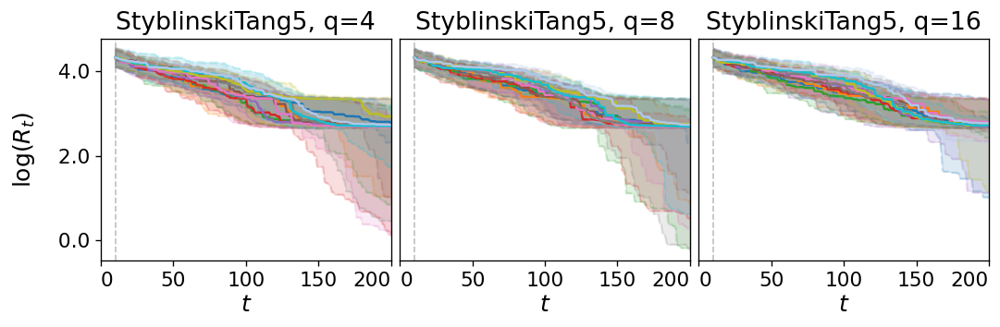

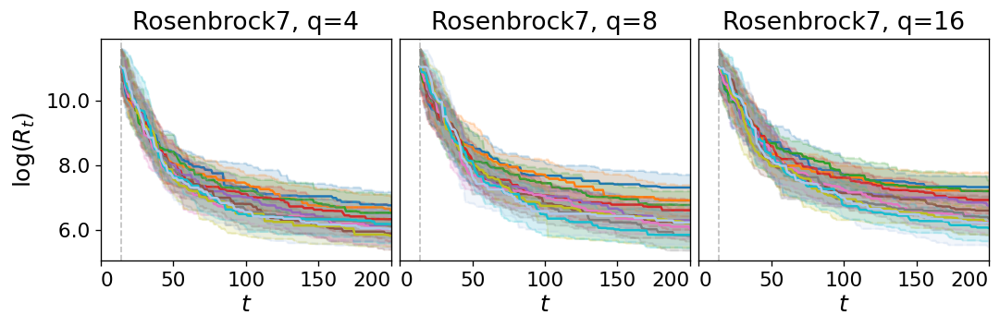

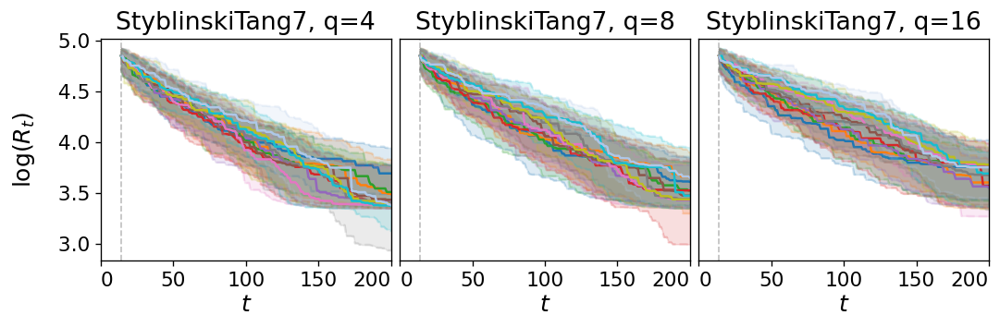

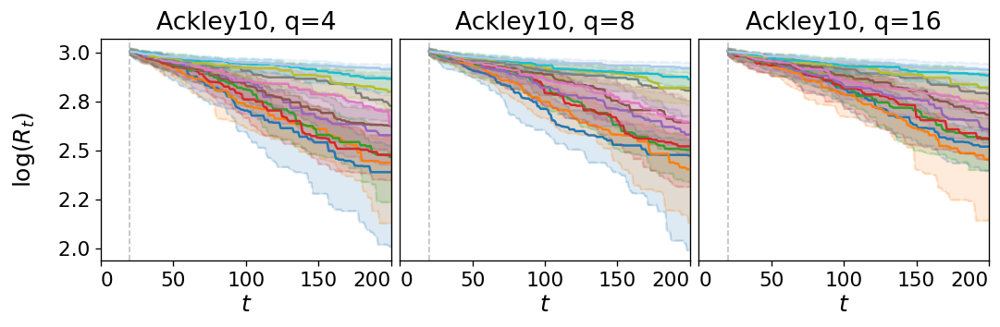

In [40]:
time_func = 'halfnorm'

aegis.plotting.make_conv_plots(
    ts_prop_D,
    time_func,
    problems,
    workers,
    budget,
    ts_prop_names,
    method_cols,
    fname_prefix="tsprop",
    TITLE_FONTSIZE=TITLE_FONTSIZE,
    LABEL_FONTSIZE=LABEL_FONTSIZE,
    TICK_FONTSIZE=TICK_FONTSIZE,
    savefig=savefig,
)

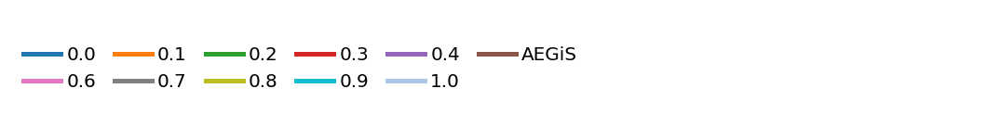

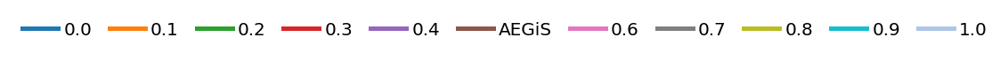

In [41]:
# ['No PF', 'No TS', 'No Exploit', 'AEGiS']
aegis.plotting.make_legend(
    ts_prop_paper_names, 
    method_cols, 
    onecol_inds=[0, 6, 1, 7, 2, 8, 3, 9, 4, 10, 5],
    twocol_inds=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
    
    
    savefig=savefig,
    fname_prefix="tsprop",
)

In [42]:
time_func = 'halfnorm'

ts_prop_td = aegis.plotting.create_table_data(
    ts_prop_D[time_func],
    workers,
    problems,
    ts_prop_names,
    51
)

In [43]:
problem_rows = [
    ['Branin', 'Eggholder', 'GoldsteinPrice', 'SixHumpCamel', 'Hartmann3'],
    ['Ackley5', 'Michalewicz5', 'StyblinskiTang5', 'Hartmann6', 'Rosenbrock7'],
    ['StyblinskiTang7', 'Ackley10',  'Michalewicz10', 'Rosenbrock10', 'StyblinskiTang10']
]

problem_dim_rows = [
    [2, 2, 2, 2, 3], 
    [5, 5, 5, 6, 7],
    [7, 10, 10, 10, 10]
]

problem_paper_rows = problem_rows

for n_workers in workers:
    aegis.plotting.create_table(
        ts_prop_td, 
        n_workers, 
        problem_rows, 
        problem_paper_rows,
        problem_dim_rows, 
        ts_prop_names, 
        ts_prop_paper_names,
        caption=f'N = {n_workers:d}'
    )


\begin{table*}[t]
\setlength{\tabcolsep}{2pt}
\newcolumntype{z}{>{\small}S}
\sisetup{table-format=1.2e-1,table-number-alignment=center}
\caption{N = 4}
\resizebox{1\textwidth}{!}{%
\begin{tabular}{l Sz Sz Sz Sz Sz}
\toprule
    \bfseries Method
    & \multicolumn{2}{c}{\bfseries Branin (2)} 
    & \multicolumn{2}{c}{\bfseries Eggholder (2)} 
    & \multicolumn{2}{c}{\bfseries GoldsteinPrice (2)} 
    & \multicolumn{2}{c}{\bfseries SixHumpCamel (2)} 
    & \multicolumn{2}{c}{\bfseries Hartmann3 (3)} \\ 
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}
    & \multicolumn{1}{c}{Median} & \multicolumn{1}{c}{MAD}  \\ \midrule
    0.0 & 4.31e-03 & 4.14e-03 & \statsimilar 6.57e+01 & \statsimilar 8.01e+01 & 2.06e+00 & 2.23e+00 & 1.25e-03 & 1.45e-03 & 2.95e-03 & 3.03e-03 \\
    0.1 & 8.79e-06 & 9.91e-06 & \sta

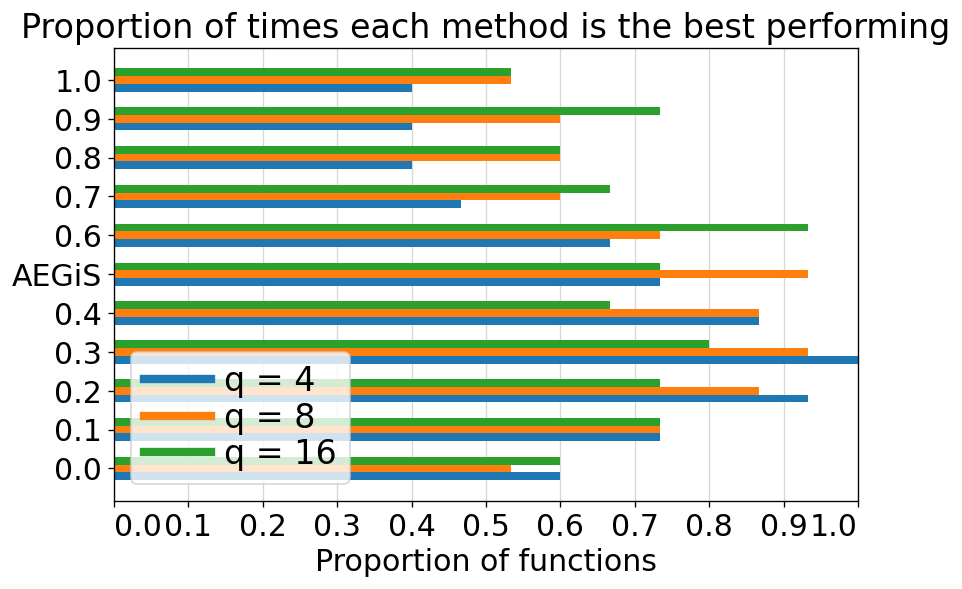

In [44]:
aegis.plotting.make_equaltobest_plot(
    ts_prop_td, 
    ts_prop_paper_names, 
    problems, 
    workers,
    legendloc="lower left",
    plotheight=5,
    TICK_FONTSIZE=18,
    LEGEND_FONTSIZE=20,
    TITLE_FONTSIZE=20,
    fname_prefix="tsprop",
    savefig=savefig,
)